In [ ]:
import tensorflow as tf
import numpy as np
from collections import namedtuple
import matplotlib.pyplot as plt
from matplotlib import animation
import random
from IPython.display import HTML
import time
from src.neuralprocesses import split_context_target, NeuralProcessParams
from src.neuralprocesses.network import *
from src.neuralprocesses.loss import *
from src.neuralprocesses.predict import *
from src.neuralprocesses.process import *

%matplotlib inline

# Neural processes

<img src="paper.png">

<small><a href="https://arxiv.org/abs/1807.01622">https://arxiv.org/abs/1807.01622</a></small>

## Introduction: Random Functions

Traditional supervised machine learning, including Deep Learning, aims to find the optimal mapping from some input to some output according to some cost function, given a set of samples. This assumes that those and any future samples are generated from a single function `y = f(x)`.

The data in some domains can however better be interpreted as multiple sets of samples where each set is generated from a different function. In other words, data is generated in a 2 step process: 1) a function is sampled from a set of function, and 2) the output is generated by applying that function to the input. Examples of such a process could be the weather, where the local climate is a sample of a wide range of weather functions, or perhaps an image of a handwritten digit, where the pixel values are determined by a function specific to the corresponding digit.

If this function selection is interpreted as a stochastic process, this can be formalized as:

### Stochastic Process

* Random function:
$$
F: {\mathcal X} \rightarrow {\mathcal Y}
$$

* Output is a random variable:
$$
Y_{1:n}:=(F(x_1), F(x_2), \dots, F(x_n))
$$

* In case of Gaussian Process (GP), joint distributions of $Y$ are multivariate Gaussians

### Learning Problem
1. Predict which function $f$ data is generated from.
    * Based on *context* input and output samples $(x, y)_{context}$,<br>
      e.g. past temperatures, or some pixels of full image

2. Predict output $y$.
    * Given *target* inputs $x_{target}$

### Gaussian Process

In [2]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ExpSineSquared
import numpy as np
import matplotlib.pyplot as plt

In [3]:
ccycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
def plot_samples(xs, sample_ys, xlim=(-1.0, 1.0), ax=None, c=None):
    if ax is None:
        _, ax = plt.subplots(figsize=(12, 6))
    if c is None:
        c = ccycle[0]
    n_samples = sample_ys.shape[1]
    for i in range(n_samples):
        ax.plot(xs, sample_ys[:,i], c=c, alpha=15.0 / n_samples)
    return ax


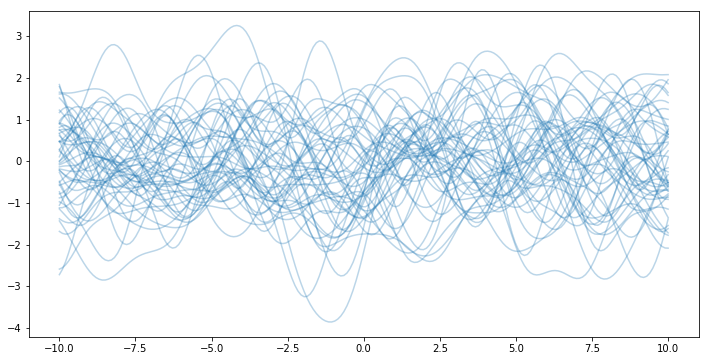

In [ ]:
gp = GaussianProcessRegressor(RBF())
xs = np.linspace(-10, 10, 200)
sample_ys = gp.sample_y(xs.reshape((-1, 1)), n_samples=50, random_state=int(time.time()))
_ = plot_samples(xs, sample_ys)

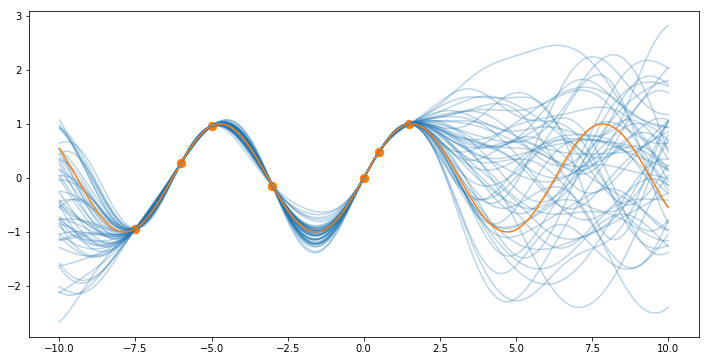

In [5]:
context_xs = np.array([-7.5, -6, -5, -3, 0, 0.5, 1.5])
context_ys = np.sin(context_xs)
gp.fit(context_xs.reshape(-1, 1), context_ys)
sample_ys = gp.sample_y(xs.reshape((-1, 1)), n_samples=50, random_state=int(time.time()))
plot_samples(xs, sample_ys)
plt.scatter(context_xs, context_ys, c=ccycle[1], s=70)
_ = plt.plot(xs, np.sin(xs), c=ccycle[1])

A GP relies heavily on the chosen kernel. If you inject the knowledge that the function is periodic with period, by replacying th `RBF()` kernel with `ExpSineSquared(periodicity=2*np.pi)`, the results look very different.

### Learning Problem (GP)

* Learn best kernel

   * Parameters optimized by maximum likelihood optimization
   * Kernel combinations (multiply, sum) $\rightarrow$ infinite space
   * (Possibly elaborate) search needed ([Automatic Statistician](https://www.automaticstatistician.com/))

* GP complexity: $O((n + m)^3)$

   * Blows up with many context + target samples

* **Solution: Neural Processes**

A neural process takes a set of context points, and maps those to a latent variable Z, the value of which should capture which function the data is generated by.

This value is then combined with the target inputs, to get to the final target outputs.

In more detail, the mapping from context points to $Z$, and from $Z$ + target input to target output, is implemented as 2 neural networks: an encoder $h$, and a decoder $g$.

These are regular dense feedforward nets, and their hyperparameters---number and size of hidden layers and output dimensionality---determine the breadth of functions that the process can capture.

Each separate context point $x_c, y_c$ is fed through $h$ to derive a an encoded representation $r_c$. These individual representations are then aggregated into a single, overall representation $r$. The aggregation operation can be any that is immune to permutations; the original authors state that a simple average works well enough.

The encoding $r$ holds the paramters for the distribution of $Z$, which is taken to be normally distributed with a mean vector and deviation vector (or, the diagonal of the covariance matrix, i.e. dimensions of $Z$ are defined to be independent).

Finally, a single value is drawn from $Z$, which is appended to each of the target inputs, the result of which is fed through $g$ to arrive at the final predictions for each target. Because the same single value of $Z$ is appended to each $x_t$, the predictions are consistent, as in they are generated from the same function defined by $z$. By sampling multiple values of $z$, multiple predictions can be generated from a range of functions, indicating the uncertainty about which function is correct given the context points.

## Experiment 0: Drawing from prior

In [6]:
cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']

x_star = np.linspace(-100, 100, 100)
n_draws = 50

def init_nn(params):    
    tf.reset_default_graph()

    sess = tf.Session()
    
    # Placeholders for training inputs
    x_context = tf.placeholder(tf.float32, (None, 1))
    y_context = tf.placeholder(tf.float32, (None, 1))
    x_target = tf.placeholder(tf.float32, (None, 1))
    y_target = tf.placeholder(tf.float32, (None, 1))
    
    # Set up NN
    train_op, loss = init_neural_process(x_context, y_context, x_target, y_target, params, learning_rate=0.001)
    
    # Initialise
    init = tf.global_variables_initializer()
    sess.run(init)
    return sess
  

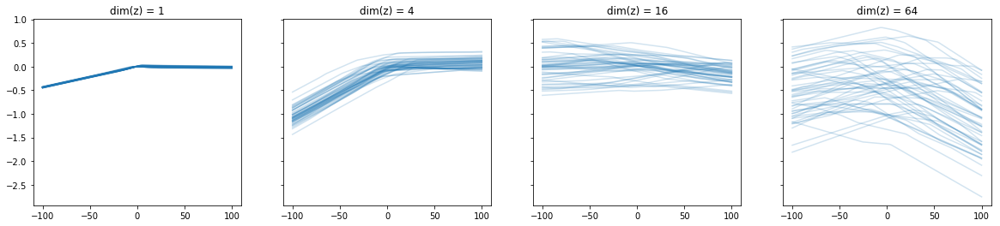

In [7]:
dim_r_values = [1, 4, 16, 64]
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 4), sharey=True)

for dim_r_i, dim_r in enumerate(dim_r_values):
    params = NeuralProcessParams(n_hidden_units_h=[8], n_hidden_units_g=[8], dim_r=dim_r, dim_z=dim_r)
    sess = init_nn(params)
    
    epsilon = tf.random_normal((n_draws, params.dim_z), 0, 10)
    prior_predict_op = prior_predict(x_star.reshape((-1,1)), params, epsilon=epsilon, n_draws=n_draws)
    y_star_mat = sess.run(prior_predict_op.mu)
    for i in range(y_star_mat.shape[1]):
        axes[dim_r_i].plot(x_star, y_star_mat.T[i], c=cycle[0], alpha=0.2)
    axes[dim_r_i].set_title('dim(z) = {}'.format(params.dim_z))

## Experiment 1: training on simple dataset

In [8]:
n_samples = 5
xs = np.linspace(-2, 2, n_samples)
ys = np.sin(xs)
n_draws = 200


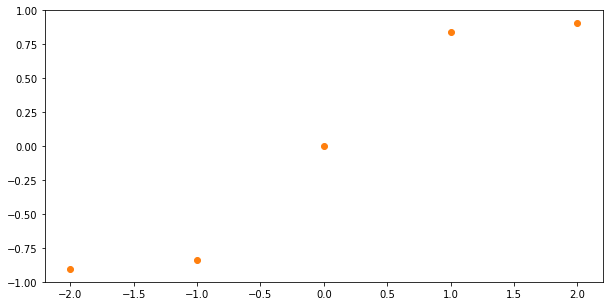

In [9]:
fig, ax = plt.subplots(figsize=(10,5))
lns = [(plt.plot([], [], c=cycle[0], alpha=0.05, animated=True))[0] for _ in range(n_draws)]
target_sct = plt.scatter(xs, ys, c=cycle[1])

In [10]:
params = NeuralProcessParams(dim_r=2, dim_z=2, n_hidden_units_h=[8], n_hidden_units_g=[8, 8, 8])

tf.reset_default_graph()

sess = tf.Session()

# Placeholders for training inputs
x_context = tf.placeholder(tf.float32, (None, 1))
y_context = tf.placeholder(tf.float32, (None, 1))
x_target = tf.placeholder(tf.float32, (None, 1))
y_target = tf.placeholder(tf.float32, (None, 1))

# Set up NN
train_op, loss = init_neural_process(x_context, y_context, x_target, y_target, params, learning_rate=0.001)

# Initialise
init = tf.global_variables_initializer()
sess.run(init)

n_iter = 5000
plot_freq = 100

x_star = np.linspace(-10, 10, 100)
# (using fixed source of randomness over all iters)
eps_value = np.random.normal(size=(n_draws, params.dim_z))
epsilon = tf.constant(eps_value, dtype=tf.float32)
predict_op = posterior_predict(xs.reshape((-1,1)), ys.reshape((-1, 1)), x_star.reshape((-1, 1)),
                                         params, epsilon)

pred_ys = []

from tqdm import tqdm_notebook

for i in tqdm_notebook(range(n_iter), desc="Training"):
    # Random number of context points
    n_context = random.choice(range(1, n_samples + 1))
    feed_dict = split_context_target(xs.reshape(-1, 1), ys.reshape(-1, 1), n_context, x_context, y_context, x_target, y_target)
    if i % plot_freq == 0:
        y_star_mat = sess.run(predict_op.mu)
        pred_ys.append(y_star_mat)
    a = sess.run((train_op, loss), feed_dict=feed_dict)


In [11]:
def init_animation():
    ax.set_xlim(-10.5, 10.5)
    ax.set_ylim(-2, 2)
    return lns

def update_animation(frame):
    for i in range(n_draws):
        lns[i].set_data(x_star, frame.T[i,:])
    return lns

In [12]:
anim = animation.FuncAnimation(fig, update_animation, frames=pred_ys, init_func=init_animation, blit=True)
HTML(anim.to_jshtml())

## Experiment 2: training on a class of functions

In [13]:
params = NeuralProcessParams(dim_r=2, dim_z=2, n_hidden_units_h=[8], n_hidden_units_g=[32, 32, 32])

tf.reset_default_graph()

sess = tf.Session()

# Placeholders for training inputs
x_context = tf.placeholder(tf.float32, (None, 1))
y_context = tf.placeholder(tf.float32, (None, 1))
x_target = tf.placeholder(tf.float32, (None, 1))
y_target = tf.placeholder(tf.float32, (None, 1))

# Set up NN
train_op, loss = init_neural_process(x_context, y_context, x_target, y_target, params, learning_rate=0.001)

# Initialise
init = tf.global_variables_initializer()
sess.run(init)

n_iter = 100000
loss_freq = 1e3

for i in tqdm_notebook(range(n_iter), desc="Training"):
    n_obs = 20
    xs = np.random.uniform(-3, 3, n_obs)
    amp = random.uniform(-2, 2)
    ys = amp * np.sin(xs)
    
    n_context = random.choice(range(1, 11))
    feed_dict = split_context_target(xs.reshape(-1, 1), ys.reshape(-1, 1), n_context, x_context, y_context, x_target, y_target)
    a = sess.run((train_op, loss), feed_dict=feed_dict)
    if i % loss_freq == 0:
        print("Loss: {:.3f}".format(a[1]))


Loss: 3968.941
Loss: 161.014
Loss: 3.523
Loss: 26.312
Loss: 208.245
Loss: -11.957
Loss: 9.544
Loss: -10.754
Loss: 64.925
Loss: 54.468
Loss: 78.352
Loss: -0.862
Loss: -14.140
Loss: 41.186
Loss: 34.416
Loss: 22.100
Loss: -13.968
Loss: 0.037
Loss: -9.176
Loss: -14.079
Loss: -11.222
Loss: -10.069
Loss: -19.126
Loss: -17.007
Loss: -8.029
Loss: -17.059
Loss: 18.011
Loss: 54.093
Loss: 73.106
Loss: 4.391
Loss: -8.602
Loss: -23.163
Loss: 96.712
Loss: 3.816
Loss: 21.477
Loss: -14.787
Loss: -15.029
Loss: 1.148
Loss: -17.993
Loss: -2.159
Loss: -17.703
Loss: -11.320
Loss: 27.792
Loss: 3.098
Loss: 85.073
Loss: -31.644
Loss: 48.365
Loss: 82.895
Loss: -15.668
Loss: -33.697
Loss: 8.826
Loss: -18.034
Loss: -6.266
Loss: 13.781
Loss: 10.020
Loss: 121.315
Loss: -11.771
Loss: 63.514
Loss: -11.553
Loss: 46.003
Loss: 53.608
Loss: 36.079
Loss: -17.529
Loss: -21.131
Loss: -11.866
Loss: 117.866
Loss: -14.251
Loss: -20.717
Loss: 42.345
Loss: 32.131
Loss: 26.388
Loss: 1.386
Loss: 137.103
Loss: 6.854
Loss: -8.917
L

In [14]:
import itertools

x_star = np.linspace(-4, 4, 100)
z1s = np.arange(-4, 5)
z2s = np.arange(-4, 5)

# Sampls of Z are taken by using fixed 'random' values that get multipled with the distribution's std
eps_value = np.asarray(list(itertools.product(z1s, z2s)))
eps = tf.constant(eps_value, dtype=tf.float32)

prior_predict_op = prior_predict(x_star.reshape((-1,1)), params, eps)
y_star_mat = sess.run(prior_predict_op.mu).reshape((-1, len(z1s), len(z1s)))

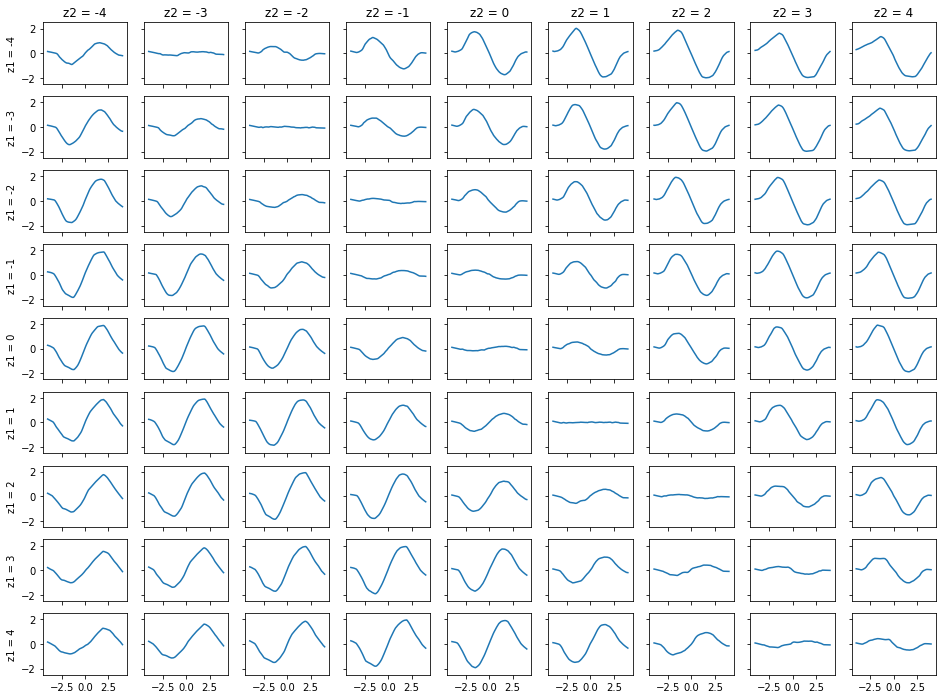

In [15]:
fig, axes = plt.subplots(len(z1s), len(z2s), sharex=True, sharey=True, figsize=(16, 12))

for i in range(len(z1s)):
    for j in range(len(z2s)):
        ax = axes[i][j]
        if i == 0:
            ax.set_title("z2 = {}".format(z2s[j]))
        if j == 0:
            ax.set_ylabel("z1 = {}".format(z1s[i]))
        
        ax.set_xlim((-4.5, 4.5))
        ax.set_ylim((-2.5, 2.5))
        y_star = y_star_mat[:,i,j]
        ax.plot(x_star, y_star)

In [16]:
z1s = np.linspace(-4, 4, 41)
z2s = np.linspace(-4, 4, 41)

# Sampls of Z are taken by using fixed 'random' values that get multipled with the distribution's std
eps_value = np.asarray(list(itertools.product(z1s, z2s)))
eps = tf.constant(eps_value, dtype=tf.float32)

prior_predict_op = prior_predict(x_star.reshape((-1,1)), params, eps)
y_star_mat = sess.run(prior_predict_op.mu).reshape((-1, len(z1s), len(z1s)))

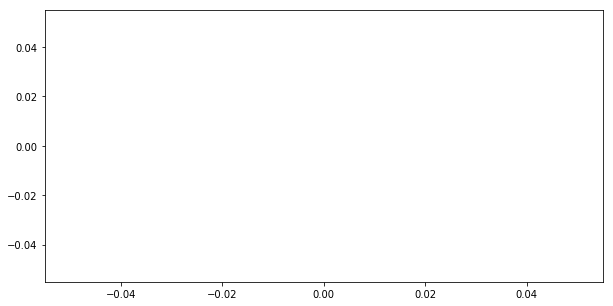

In [17]:
cmap = plt.get_cmap('viridis')

fig, ax = plt.subplots(figsize=(10,5))
lns = [(plt.plot([], [], alpha=1, c=cmap(z / (len(z1s) - 1)), animated=True))[0] for z in range(len(z1s))]

In [18]:
def init_animation():
     ax.set_xlim(-4.5, 4.5)
     ax.set_ylim(-2, 2)
     return lns

def update_animation(frame):
    for i in range(frame.shape[0]):
        lns[i].set_data(x_star, frame[i,:])
    return lns

anim = animation.FuncAnimation(fig, update_animation, frames=y_star_mat.transpose(1, 2, 0), init_func=init_animation, blit=True)
HTML(anim.to_jshtml())

In [19]:
def init_animation():
     ax.set_xlim(-4.5, 4.5)
     ax.set_ylim(-2, 2)
     return lns

def update_animation(frame):
    for i in range(frame.shape[0]):
        lns[i].set_data(x_star, frame[i,:])
    return lns

anim = animation.FuncAnimation(fig, update_animation, frames=y_star_mat.transpose(2, 1, 0), init_func=init_animation, blit=True)
HTML(anim.to_jshtml())

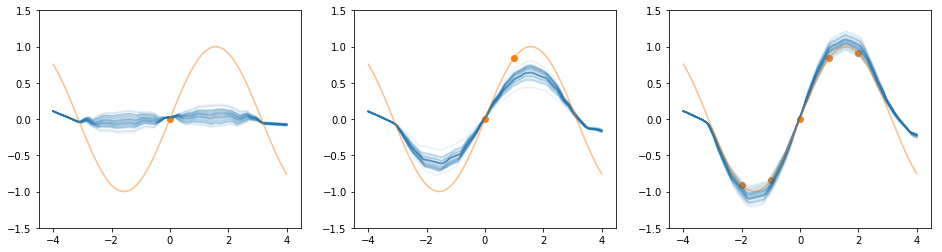

In [20]:
def plot_prediction(ax, xs, ys):
    posterior_predict_op = posterior_predict(xs.reshape((-1,1)), ys.reshape((-1,1)), x_star.reshape((-1,1)), params, n_draws=50)
    y_star_mat = sess.run(posterior_predict_op.mu)

    for i in range(y_star_mat.shape[1]):
        ax.plot(x_star, y_star_mat.T[i], c=cycle[0], alpha=0.1)
    ax.plot(x_star, np.sin(x_star), c=cycle[1], alpha=.5)
    ax.scatter(xs, ys, c=cycle[1])
    ax.set_xlim((-4.5, 4.5))
    ax.set_ylim((-1.5, 1.5))

fig, axes = plt.subplots(1, 3, figsize=(16,4))
xss = [np.array(xs) for xs in [[0], [0, 1], [-2, -1, 0, 1, 2]]]
yss = [np.sin(xs) for xs in xss]
for ax, xs, ys in zip(axes, xss, yss):
    plot_prediction(ax, xs, ys)


<center><img src="digits.png" width="50%"></center>

<center><img src="faces.png" width="50%"></center>